#  프로젝트: 인물 모드 문제점 찾기

1. 배경이 있는 셀카를 촬영합니다. (배경과 사람의 거리가 약간 멀리 있으면 좋습니다.)
2. 시맨틱 세그멘테이션(Semantic segmentation)으로 피사체(사람)와 배경을 분리합니다.
3. 블러링(blurring) 기술로 배경을 흐리게 합니다.
4. 피사체를 배경의 원래 위치에 합성합니다.

## Step 1. 인물모드 직접 해 보기

In [1]:
import os # Operating System
import urllib # URL 작업을 위한 여러 모듈을 모은 패키지.
import cv2 # OpenCV 라이브러리
import numpy as np
from pixellib.semantic import semantic_segmentation # 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
from matplotlib import pyplot as plt ## 데이터 시각화 도구

### 이미지 경로 저장 및 불러오기

(2304, 3456, 3)


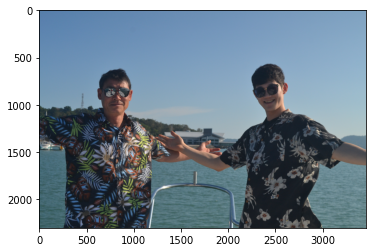

In [2]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/me_and_father_sunglass.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

# cv2는 BGR채널로 불러오기 때문에 RGB로 변경
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

#### 모델 파일 경로 설정, 모델 다운로드

In [3]:
# 모델 파일 경로 설정
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 


In [4]:
# # PixelLib가 제공하는 모델의 url입니다
# model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장
# urllib.request.urlretrieve(model_url, model_file)

### 학습된 모델 호출

In [5]:
# PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model = semantic_segmentation()
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 모델(model_file)을 로드하는 함수를 호출

In [6]:
# segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [7]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

#### 모델 학습 결과

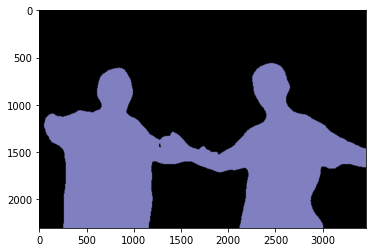

In [8]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

In [9]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [10]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


### 컬러맵 만들기 

In [11]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!

# 컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

In [12]:
for i in range(len(LABEL_NAMES)):
    
    print(f'{LABEL_NAMES[i]}의 Colormap : {colormap[i]}')

background의 Colormap : [0 0 0]
aeroplane의 Colormap : [128   0   0]
bicycle의 Colormap : [  0 128   0]
bird의 Colormap : [128 128   0]
boat의 Colormap : [  0   0 128]
bottle의 Colormap : [128   0 128]
bus의 Colormap : [  0 128 128]
car의 Colormap : [128 128 128]
cat의 Colormap : [64  0  0]
chair의 Colormap : [192   0   0]
cow의 Colormap : [ 64 128   0]
diningtable의 Colormap : [192 128   0]
dog의 Colormap : [ 64   0 128]
horse의 Colormap : [192   0 128]
motorbike의 Colormap : [ 64 128 128]
person의 Colormap : [192 128 128]
pottedplant의 Colormap : [ 0 64  0]
sheep의 Colormap : [128  64   0]
sofa의 Colormap : [  0 192   0]
train의 Colormap : [128 192   0]
tv의 Colormap : [  0  64 128]


In [13]:
# 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서
seg_color = (128,128,192) 

(2304, 3456)


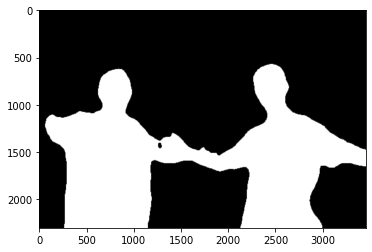

In [14]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

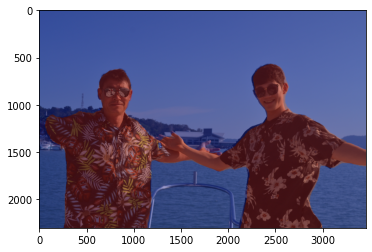

In [15]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 블러이미지 생성

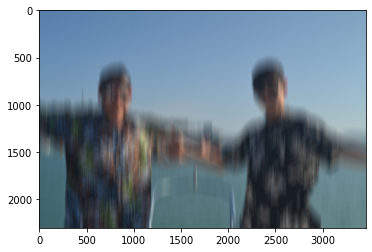

In [16]:
blurring_kernel_size = (5,200)

img_orig_blur = cv2.blur(img_orig, blurring_kernel_size)

plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

segmentation 결과를 이용해서 이미지 분리

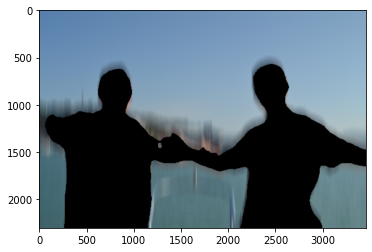

In [17]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

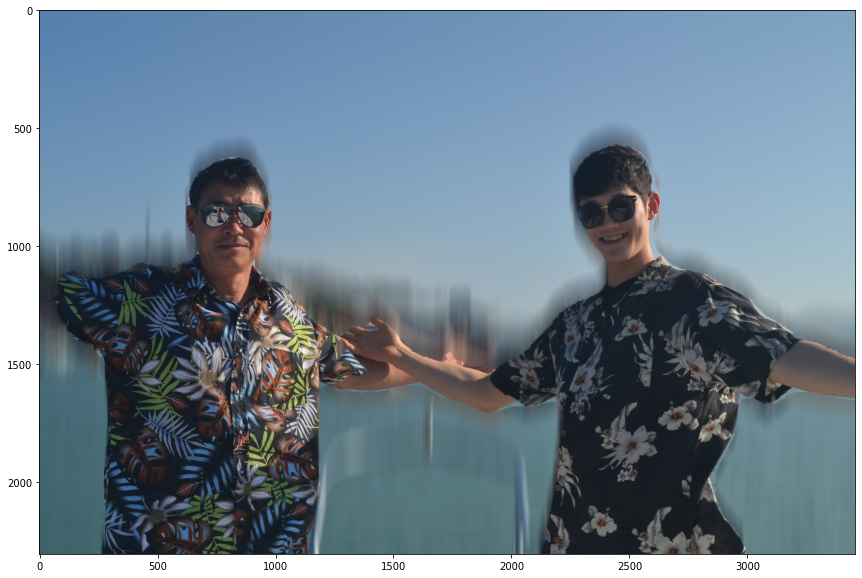

In [18]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

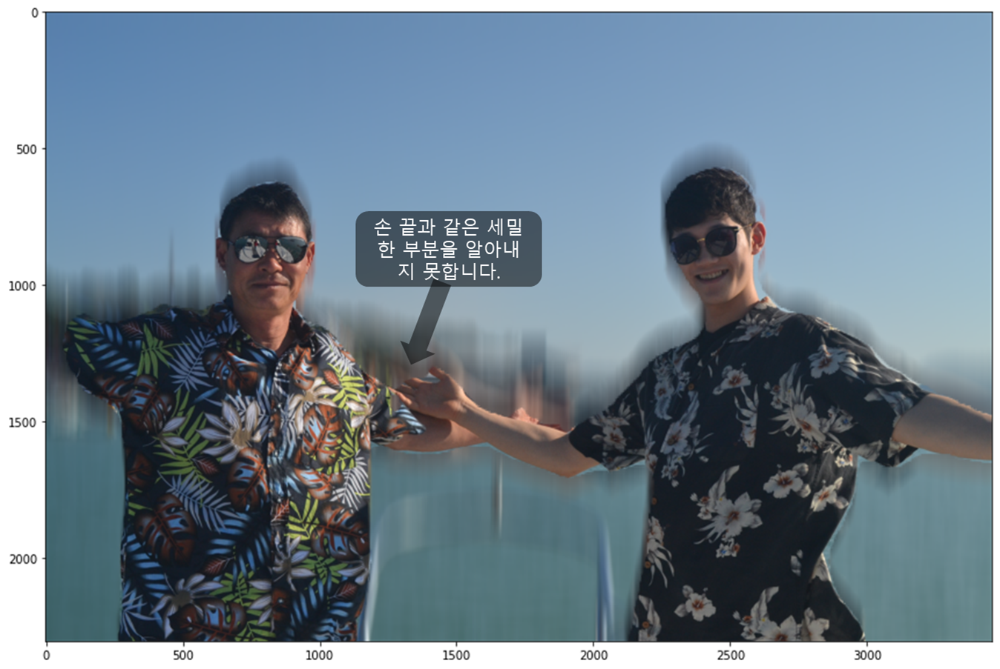

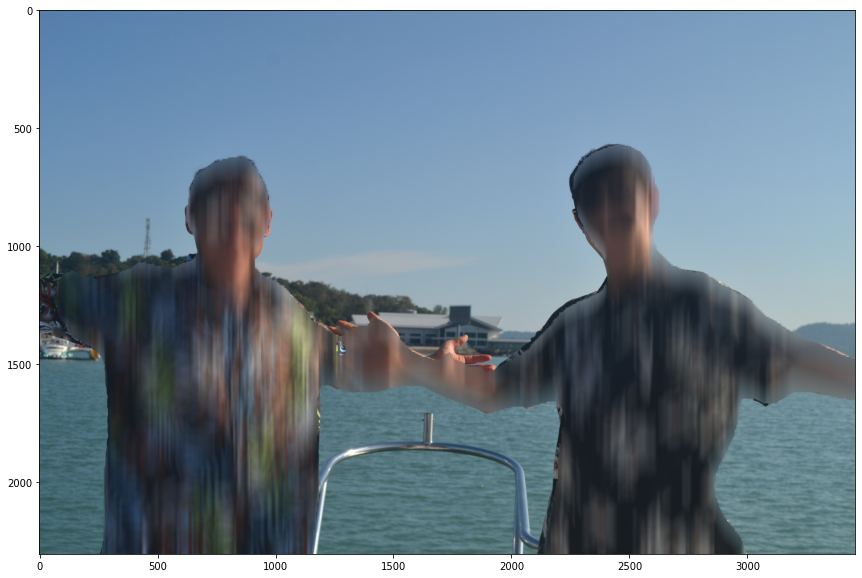

In [19]:
img_concat = np.where(img_mask_color==255,img_orig_blur,img_orig)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2. 사진에서 문제점 찾기

### 함수로 정리.

In [20]:
# 이전 변수 제거
%reset -f 

import os # Operating System
import urllib # URL 작업을 위한 여러 모듈을 모은 패키지.
import cv2 # OpenCV 라이브러리
import numpy as np
from pixellib.semantic import semantic_segmentation # 이미지 및 비디오 segmentation을 수행하기 위한 라이브러리. 
from matplotlib import pyplot as plt ## 데이터 시각화 도구

In [21]:
# 모델 불러오기
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

# 이미지저장 경로
img_dir_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/' 

* pascalvoc 데이터의 라벨종류
    + 'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'

In [22]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
# 컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

pascalvoc_labels = {}
for i in range(len(LABEL_NAMES)):
    pascalvoc_labels[LABEL_NAMES[i]] = colormap[i]

In [23]:
def camera_human_mode(image_path, seg_model, chromaky_path='blur', \
                      seg_RGB_color=[192, 128, 128], blurring_kernel_size=(20,20), \
                     show_fig=True):
    # 이미지 불러오기
    img = cv2.imread(image_path) 
    
    # 배경 이미지
    if chromaky_path == 'blur':  # default
        img_bg = cv2.blur(img, blurring_kernel_size)
    else:
        img_bg = cv2.imread(chroma_path)  # 크로마키 이미지를 불러온다.
        # 입력이미지와 사이즈를 동일하게 변경
        img_bg = cv2.resize(img_bg, (img.shape[1], img.shape[0])) 
        
    
    # RGB -> BGR 함수에 입력된 colormap은 RGB채널이지만 
    #   아래의 segmentation 모델의 결과는 BGR이므로 변경
    seg_color = [0,0,0]
    seg_color[0] = seg_RGB_color[2]
    seg_color[1] = seg_RGB_color[1]
    seg_color[2] = seg_RGB_color[0]

    # 모델 학습
    segvalues, output = seg_model.segmentAsPascalvoc(image_path) 
    
    # 관심영역 생성
    seg_map = np.all(output==seg_color, axis=-1) # boolean
    img_mask = seg_map.astype(np.uint8) * 255
    
    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    
    img_bg_mask = cv2.bitwise_not(img_mask_color)
    img_bg_crop = cv2.bitwise_and(img_bg, img_bg_mask)

    img_concat = np.where(img_mask_color==255, img, img_bg_crop)
    
    if show_fig == True:
        LABEL_NAMES = [
        'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
        'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
        'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
        ]
        print('감지된 객체 : ',[LABEL_NAMES[i] for i in segvalues['class_ids']])
        plt.figure(figsize=(20,20))
        plt.subplot(2,2,1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original_image')
        plt.subplot(2,2,2)
        plt.imshow(cv2.cvtColor(cv2.addWeighted(img, 0.4, output, 0.6, 0.0), cv2.COLOR_BGR2RGB))
        plt.title('Segmentation_output')
        plt.subplot(2,2,3)
        plt.imshow(cv2.cvtColor(img_mask_color, cv2.COLOR_BGR2RGB))
        plt.title('Area of interest')
        plt.subplot(2,2,4)
        plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
        plt.title('Result image')
        plt.tight_layout()
        plt.show()
    
    return img_concat

감지된 객체 :  ['background', 'dog', 'person', 'pottedplant']


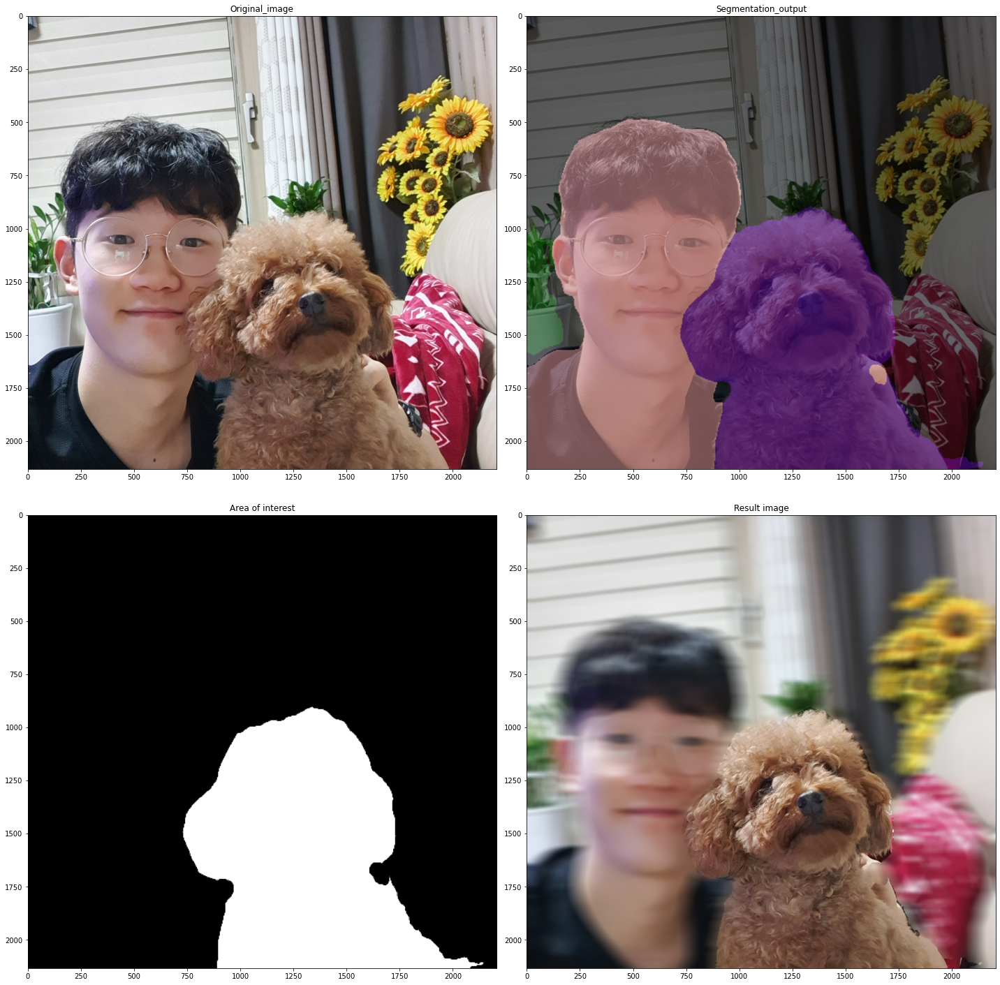

In [24]:
# 이미지 불러오기
img_file_name = 'dog_and_me.jpg'

img_path = img_dir_path+img_file_name

output_img = camera_human_mode(img_path, model, chromaky_path='blur', \
                               seg_RGB_color=pascalvoc_labels['dog'], \
                               blurring_kernel_size=(100,20))

감지된 객체 :  ['background', 'bird', 'person']


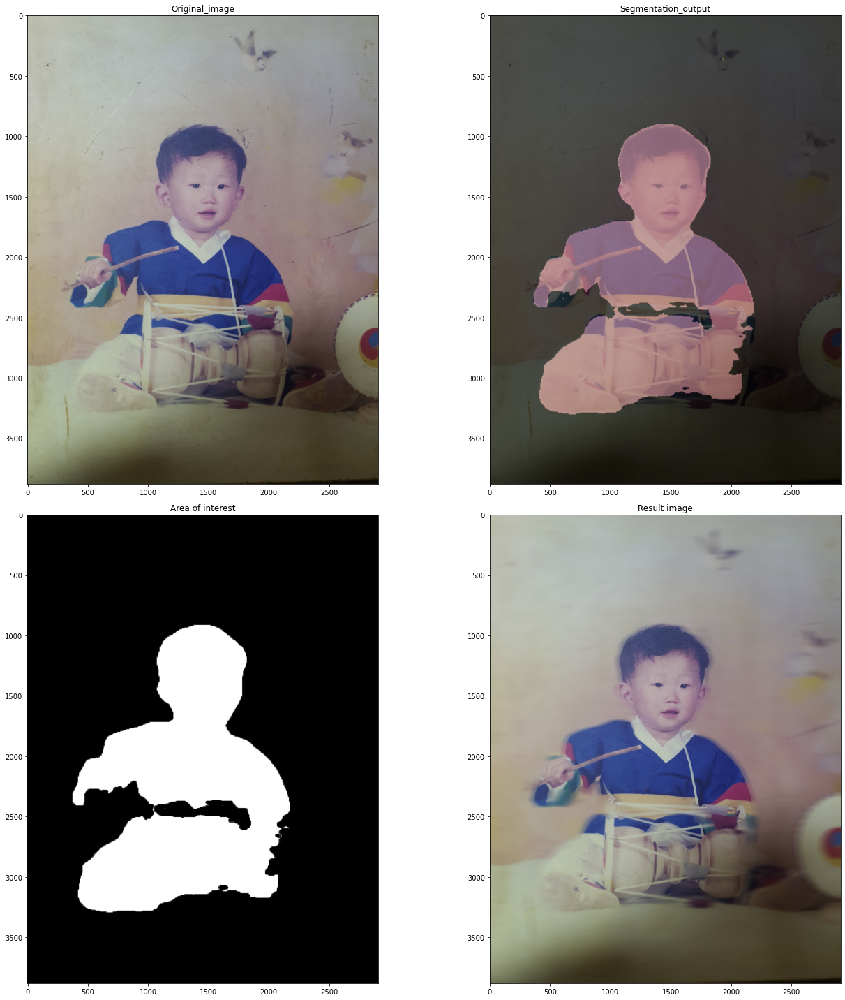

In [25]:
# 이미지 불러오기
img_file_name = 'baby_me.jpg'

img_path = img_dir_path+img_file_name

output_img = camera_human_mode(img_path, model, chromaky_path='blur', \
                               seg_RGB_color=pascalvoc_labels['person'], \
                               blurring_kernel_size=(100,20))

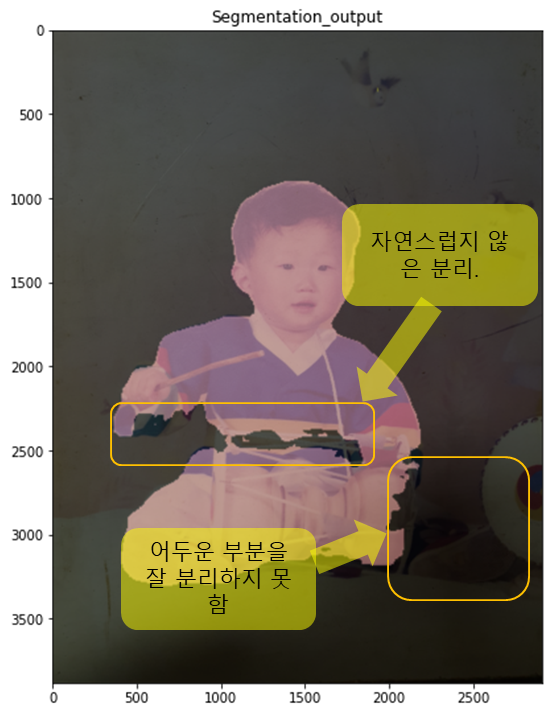

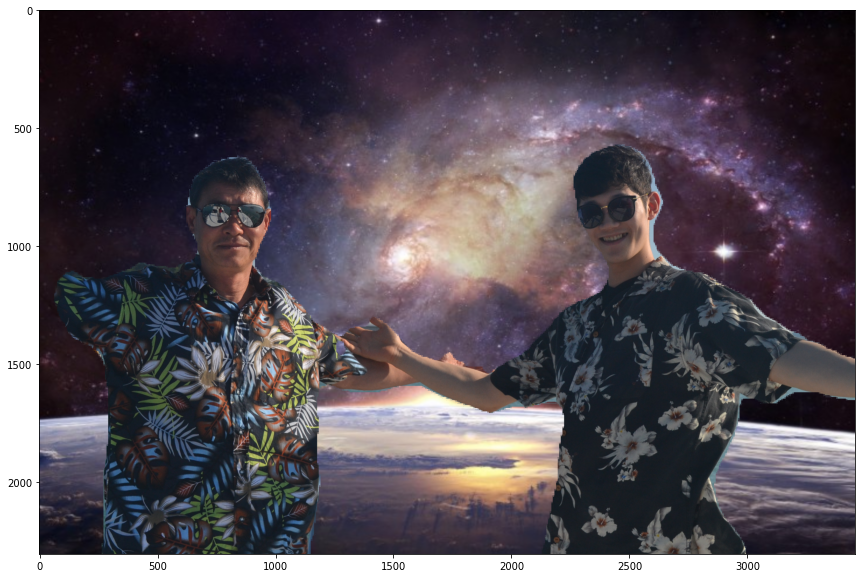

In [26]:
# 이미지 불러오기
img_file_name = 'me_and_father_sunglass.jpg'
chromakey_file_name = 'space_chroma.jpg'

img_path = img_dir_path+img_file_name
chroma_path = img_dir_path+chromakey_file_name

output_img = camera_human_mode(img_path, model, chromaky_path=chroma_path, \
                               seg_RGB_color=pascalvoc_labels['person'], \
                               blurring_kernel_size=(100,20),show_fig=False)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.show()

## Step 3. 해결 방법을 제안해 보기



* 세밀한 부분을 찾지 못하는 것에 대해 작은 크기의 커널로 경계주위 및 이미지를 슬라이딩하며 세밀한 부분의 경계를 찾을 수 있을것같다. 또한 다양한 밝기를 가지고 분리한 이미지를 검사해보는 것도 좋을것 같다. 

감지된 객체 :  ['background', 'person']


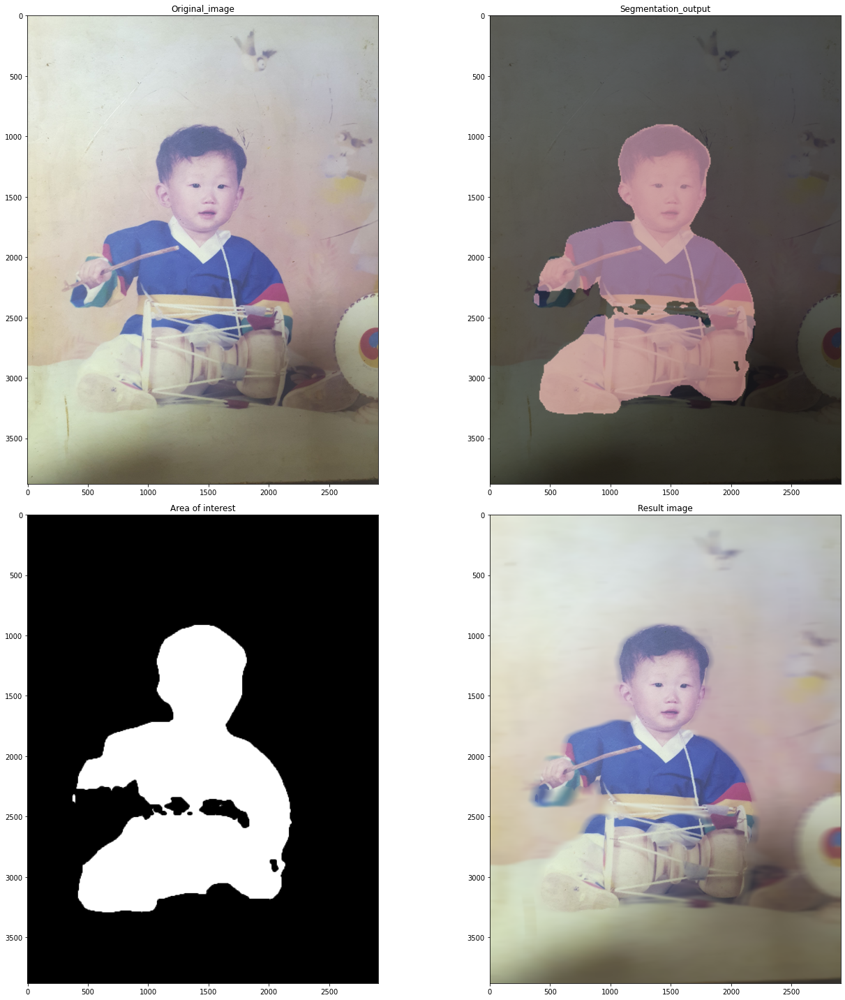

In [27]:
# 이미지 불러오기
img = cv2.imread(img_dir_path+'baby_me.jpg',cv2.IMREAD_COLOR)
val = 40
array = np.full(img.shape,(val,val,val),dtype=np.uint8)

img_add = cv2.add(img,array) # 이미지의 밝기를 `val`만큼 올렸다. 

img_file_name = 'baby_me_shine.jpg'
img_path = img_dir_path+img_file_name
cv2.imwrite(img_path,img_add)

output_img = camera_human_mode(img_path, model, chromaky_path='blur', \
                               seg_RGB_color=pascalvoc_labels['person'], \
                               blurring_kernel_size=(100,20))

* [Water filling algorithm](https://github.com/seungjun45/Water-Filling)   
그림자를 제거해주는 알고리즘이다. 이미지에서 그림자를 제거하고 분리하는 것으로 좋은 효과를 볼 수 있을 것이다. 